# Import required libraries, fetch data from database into pandas.DataFrame and format data type for PCA

In [18]:
import numpy as np  
import sqlite3
import matplotlib.pylab as plt
import datetime as DT
import seaborn as sns
np.set_printoptions(precision=5)
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
#### import the PCA library from scikit learn library
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D  # didn't get to use this
%matplotlib inline

# Normalizing (scaling) the data is VERY important - indeed can be important to many machine 
# learning algorithms.  Take the original features and scale them so that they all have zero 
# mean and unit variance
from sklearn import preprocessing

## pandas actually has a command to read_sql or read_sql_query and return a pandas.DataFrame
## coerce_float=True argument to force float data type
## Need to FIRST connect to the database by creating a connection object called conn.
conn = sqlite3.connect('database.sqlite')

# create a cursor object using the conn object method
# The cursor object has methods for accessing the data
# c = conn.cursor()  # this is not needed for the pd.read_sql IO tool

# Get the database table list from information in the sqlite_master table
# Follow convention to type SQL commands in all caps

# preview all tables in the database
print ('======')
print ('Tables in the database')
# Set the execute SQL command, Fetch and print all table names and info, and
# return a pandas DataFrame
df_tables = pd.read_sql("""SELECT * FROM sqlite_master WHERE type='table';""", conn)
print('df_tables shape: ', df_tables.shape)
print(df_tables)
print ('======')
print('Player_Attributes table:')
print(df_tables.sql[1]) # get sql that CREATE the Player_Atrribtues table
print ('======')
print('Player table:')
print(df_tables.sql[2]) # get sql that CREATE the Player table
print ('======')
print ('Player table')
df_Player = pd.read_sql("""SELECT * FROM Player """, conn)
print('df_Player.shape:', df_Player.shape)
print(df_Player.columns)
print(df_Player.head())
print ('======')
print ('Player_Attributes table')
df_Player_Attributes = pd.read_sql("""SELECT * FROM Player_Attributes""", conn) 
print('df_Player_Attributes.shape:', df_Player_Attributes.shape)
print(df_Player_Attributes.columns)
print(df_Player_Attributes.head())
print ('======')

# acquire data from database using pd.read_sql_query(sql, , ,)
# build SQL to SELECT all columns from both Player and Player_Attributes tables 
# for rows reocrds w/ matching player_fifa_api_id
sql="SELECT * FROM Player INNER JOIN Player_Attributes ON Player.player_fifa_api_id=Player_Attributes.player_fifa_api_id;"     
df_all_col=pd.read_sql_query(sql, conn, coerce_float=True, params=None, parse_dates=['birthday','date'], chunksize=None)
# calculate age of player at the time attributes were collected
df_all_col['age'] = (df_all_col.date - df_all_col.birthday).astype('timedelta64[Y]') 

#Tally total score per player attribute category
df_all_col['total_attack'] = df_all_col.crossing + df_all_col.finishing + df_all_col.heading_accuracy + \
                                df_all_col.short_passing + df_all_col.volleys
df_all_col['total_skill'] = df_all_col.dribbling + df_all_col.curve + df_all_col.free_kick_accuracy + df_all_col.long_passing + \
                                df_all_col.ball_control
df_all_col['total_movement'] = df_all_col.acceleration + df_all_col.sprint_speed + df_all_col.agility + \
                                df_all_col.reactions + df_all_col.balance
df_all_col['total_power'] = df_all_col.shot_power + df_all_col.jumping + df_all_col.stamina + df_all_col.strength + \
                            df_all_col.long_shots
df_all_col['total_mentality'] = df_all_col.aggression + df_all_col.interceptions + df_all_col.positioning + \
                                df_all_col.vision + df_all_col.penalties
df_all_col['total_defending'] = df_all_col.marking + df_all_col.standing_tackle + df_all_col.sliding_tackle 
df_all_col['total_goalkeeping'] = df_all_col.gk_diving + df_all_col.gk_handling + df_all_col.gk_kicking + \
                                    df_all_col.gk_positioning + df_all_col.gk_reflexes
print('df_all_col.columns: ', df_all_col.columns) # print column labels for all columns from both tables
print('df_all_col.shape:', df_all_col.shape)
print(df_all_col.info()) 

# identify non_numeric and numeric columns of interest and create two lists of column labels
non_numeric_col=['player_fifa_api_id', 'player_api_id','player_name', 'birthday', 'date', \
                 'preferred_foot', 'attacking_work_rate', 'defensive_work_rate']
numeric_col = ['age', 'height', 'weight','overall_rating', 'potential','crossing', 'finishing', \
               'heading_accuracy','short_passing', 'volleys', 'dribbling', 'curve', \
               'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration', \
               'sprint_speed', 'agility', 'reactions', 'balance', 'shot_power', 'jumping', \
               'stamina', 'strength', 'long_shots', 'aggression', 'interceptions', 'positioning',\
               'vision', 'penalties', 'marking', 'standing_tackle', 'sliding_tackle', 'gk_diving', \
               'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes']
numeric_few_col = ['age', 'height', 'weight','overall_rating', 'potential', 'total_attack', 'total_skill', \
                   'total_movement', 'total_power', 'total_mentality', 'total_defending', 'total_goalkeeping']

Tables in the database
df_tables shape:  (8, 5)
    type               name           tbl_name  rootpage  \
0  table    sqlite_sequence    sqlite_sequence         4   
1  table  Player_Attributes  Player_Attributes        11   
2  table             Player             Player        14   
3  table              Match              Match        18   
4  table             League             League        24   
5  table            Country            Country        26   
6  table               Team               Team        29   
7  table    Team_Attributes    Team_Attributes         2   

                                                 sql  
0             CREATE TABLE sqlite_sequence(name,seq)  
1  CREATE TABLE "Player_Attributes" (\n\t`id`\tIN...  
2  CREATE TABLE `Player` (\n\t`id`\tINTEGER PRIMA...  
3  CREATE TABLE `Match` (\n\t`id`\tINTEGER PRIMAR...  
4  CREATE TABLE `League` (\n\t`id`\tINTEGER PRIMA...  
5  CREATE TABLE `Country` (\n\t`id`\tINTEGER PRIM...  
6  CREATE TABLE "Team" (\n

## data cleaning

In [19]:
df_all_col.replace(r'\s+', np.nan, regex=True, inplace = True)
df_all_col.dropna(axis=0, how='any', inplace=True)  #drop row (sample) with any NA entry
df_all_col.sort_values('player_name',axis=0, inplace=True)
df_all_col.drop_duplicates(inplace=True)
df_all_col.to_csv('df_all_col.csv')

print ('df_all_col.shape: ', df_all_col.shape)
print(df_all_col.shape)
print(df_all_col.info())
print(df_all_col.head())
print(df_all_col.tail())
print(df_all_col['defensive_work_rate'][0:60]) # need more data cleaning for col before ploting
print ('======')

df_unscaled_data = df_all_col[numeric_col]
print('df_unscaled_data.columns:', df_unscaled_data.columns)
print('df_unscaled_data.shape:', df_unscaled_data.shape)
print('df_unscaled_data.info: ', df_unscaled_data.info())



df_all_col.shape:  (10898, 57)
(10898, 57)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 10898 entries, 1045 to 183615
Data columns (total 57 columns):
id                     10898 non-null int64
player_api_id          10898 non-null int64
player_name            10898 non-null object
player_fifa_api_id     10898 non-null int64
birthday               10898 non-null datetime64[ns]
height                 10898 non-null float64
weight                 10898 non-null int64
id                     10898 non-null int64
player_fifa_api_id     10898 non-null int64
player_api_id          10898 non-null int64
date                   10898 non-null datetime64[ns]
overall_rating         10898 non-null float64
potential              10898 non-null float64
preferred_foot         10898 non-null object
attacking_work_rate    10898 non-null object
defensive_work_rate    10898 non-null object
crossing               10898 non-null float64
finishing              10898 non-null float64
heading_accuracy    

## Preprocess data and conduct PCA - principal component analysis

In [9]:
scaled_data = preprocessing.scale(df_unscaled_data) #center and scale the data
print('scaled data:')
print (scaled_data)  # preview scaled data

# create a PCA object.  
# sklean uses this PCA object that can be trained using one dataset and applied to another dataset
pca = PCA()  
print(type(pca))
# do PCA math, calculate loading scores and the variation each PCA accounts for
pca.fit(scaled_data)  
# generate coordinates for a PCA graph based on the loading scores and the scaled data
pca_data = pca.transform(scaled_data) 



scaled data:
[[ 1.20435 -0.50782 -0.12955 ... -0.64338 -0.19821 -0.36672]
 [ 1.20435 -0.50782 -0.12955 ...  2.36822  0.20348  0.18149]
 [ 0.98217 -0.50782 -0.12955 ...  2.36822  0.20348  0.18149]
 ...
 [-1.68402 -0.88666 -1.24685 ... -0.64338 -0.31297 -0.47637]
 [-1.68402 -0.88666 -1.24685 ... -0.64338 -0.31297 -0.47637]
 [-3.2393  -0.88666 -1.24685 ... -0.64338 -0.31297 -0.47637]]
<class 'sklearn.decomposition.pca.PCA'>


## Present Explained Variance, Scree Plot and Principal Components Scatter Matrix

percent of explained variance: 
[43.9 15.7  8.9  6.8  3.9  3.   2.2  1.7  1.3  1.1  1.   1.   0.9  0.7
  0.7  0.7  0.6  0.6  0.5  0.5  0.5  0.4  0.4  0.4  0.3  0.3  0.3  0.3
  0.2  0.2  0.2  0.2  0.1  0.1  0.1  0.1  0.1  0.1]
 


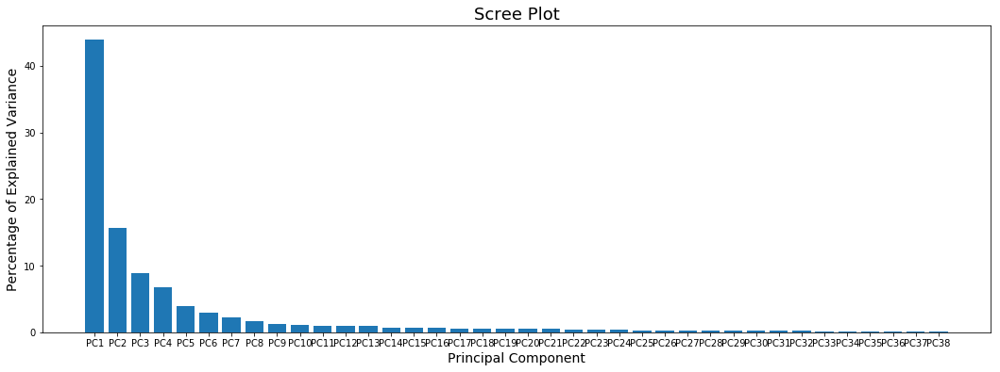

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -2.640114  1.968095  0.650296 -1.085030  0.432893 -0.997913 -0.036752   
1 -1.974144  1.547071  1.945571 -1.698880  0.785256 -0.431110  2.178955   
2 -1.998243  1.632706  1.964671 -1.818000  0.655679 -0.269227  2.168876   
3 -1.777293  1.508709  1.666837 -1.760435  0.469343 -0.019567  2.297794   
4 -2.056297  0.869395  0.466741 -1.179464  0.879790 -0.124301  2.485314   

        PC8       PC9      PC10    ...         PC29      PC30      PC31  \
0 -0.345769 -0.212905  0.717640    ...    -0.243024 -0.082784 -0.287740   
1 -0.524871  0.683914  0.138753    ...    -0.313755 -0.136859 -0.142348   
2 -0.553466  0.642269  0.157086    ...    -0.304040  0.008732 -0.030220   
3 -0.364947  0.543994  0.246732    ...    -0.335973  0.075856  0.170031   
4  0.184533  0.201187 -0.439294    ...    -0.316171  0.099965  0.113237   

       PC32      PC33      PC34      PC35      PC36      PC37      PC38  
0 -0.044248 -0.119196 -0

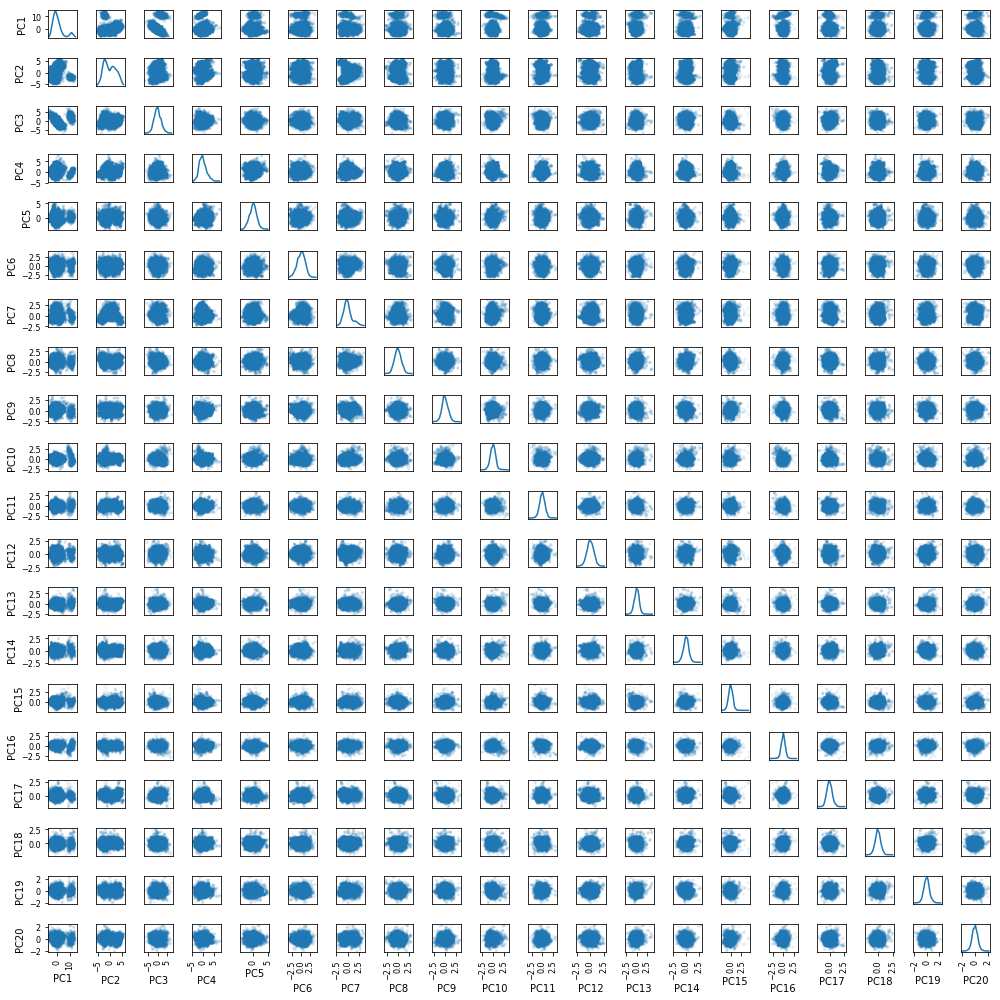

In [11]:
# pca.explained_variance_ratio_ is <class 'numpy.ndarray'>. 
# It calculates the percentage of variance that each principal component accoutns for
per_var = np.round(pca.explained_variance_ratio_*100, decimals =1) 
print('=======================')
print('percent of explained variance: ')
print(per_var)
PC_labels = ['PC'+ str(x) for x in range(1,len(per_var)+1)] # labels for the Scree Plot: PC1, PC2 ...
print(' ')
print('=======================')

# create Scree Plot
plt.figure(figsize=(18, 6))
plt.bar(x=range(1, len(per_var)+1), height=per_var, tick_label=PC_labels)
plt.ylabel('Percentage of Explained Variance', fontsize='14')
plt.xlabel('Principal Component', fontsize='14')
plt.title('Scree Plot', fontsize='18')
plt.show()
plt.close()

# put pca_data with DataFrame with PC_labels
pca_df = pd.DataFrame(pca_data, index=None, columns=PC_labels) 
print(pca_df.head()) # preview transformed and scaled  
print('=======================')


print('Principal Components Scatter Matrix')
df_pc_matrix= pca_df[['PC'+ str(x) for x in range(1,21)]] # scatter matrix for PC1, PC2, ..., PC15
pd.plotting.scatter_matrix(df_pc_matrix, alpha=0.1, figsize=(14, 14), diagonal='kde',range_padding =0.1)
plt.tight_layout()
plt.show()
plt.close()


## Take a Look at the Loading Scores of PC1, PC2 and PC3 to determine which feature has the largest influence in each principal component

In [12]:
loading_scores_PC1 = pd.Series(pca.components_[0],index=numeric_col)
loading_scores_PC1_sorted = loading_scores_PC1.abs().sort_values(ascending=False)
print('Sorted PC1 Loading Scores (abs)')
print('PC1 sorted components: ', loading_scores_PC1_sorted.index)
print(loading_scores_PC1_sorted)
print('=======')

loading_scores_PC2 = pd.Series(pca.components_[1],index=numeric_col)
loading_scores_PC2_sorted = loading_scores_PC2.abs().sort_values(ascending=False)
print('Sorted PC2 Loading Scores (abs)')
print('PC2 sorted components: ', loading_scores_PC2_sorted.index)
print(loading_scores_PC2_sorted)
print('=======')

loading_scores_PC3 = pd.Series(pca.components_[2],index=numeric_col)
loading_scores_PC3_sorted = loading_scores_PC3.abs().sort_values(ascending=False)
print('Sorted PC3 Loading Scores (abs)')
print('PC3 sorted components: ', loading_scores_PC3_sorted.index)
print(loading_scores_PC3_sorted)


Sorted PC1 Loading Scores (abs)
PC1 sorted components:  Index(['ball_control', 'dribbling', 'short_passing', 'crossing', 'curve',
       'long_shots', 'positioning', 'shot_power', 'vision', 'gk_diving',
       'free_kick_accuracy', 'gk_reflexes', 'gk_handling', 'gk_positioning',
       'volleys', 'finishing', 'acceleration', 'penalties', 'sprint_speed',
       'long_passing', 'agility', 'stamina', 'balance', 'height',
       'heading_accuracy', 'weight', 'gk_kicking', 'reactions', 'aggression',
       'overall_rating', 'potential', 'interceptions', 'standing_tackle',
       'sliding_tackle', 'marking', 'strength', 'age', 'jumping'],
      dtype='object')
ball_control          0.233895
dribbling             0.226609
short_passing         0.220168
crossing              0.213529
curve                 0.211442
long_shots            0.211257
positioning           0.204851
shot_power            0.199655
vision                0.197614
gk_diving             0.196600
free_kick_accuracy    0.196

## Present graphs pertinent to the first three principal componets:
Note: When plotting PC1 versus PC2 AND PC1 versus PC3, two clusters are displayed.  

Next, we will visualize further in PC1, PC2 and PC3.


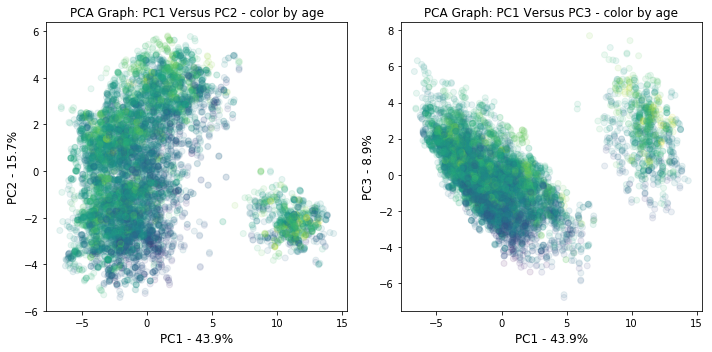

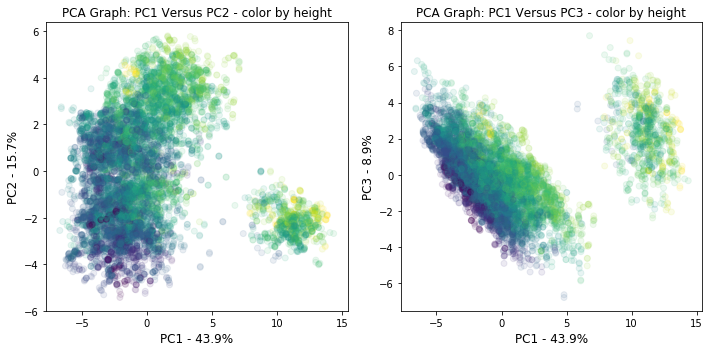

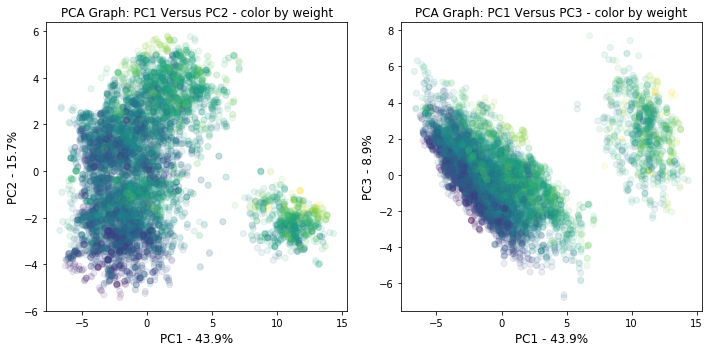

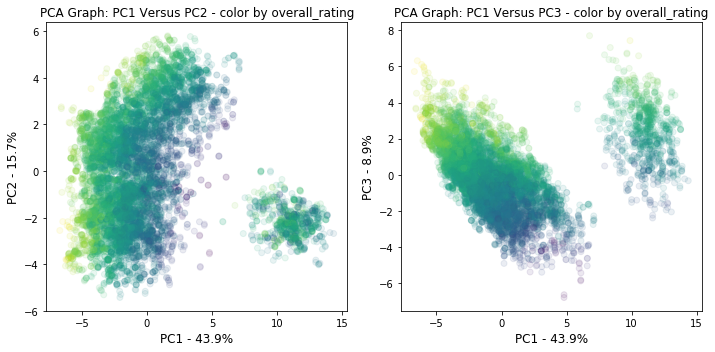

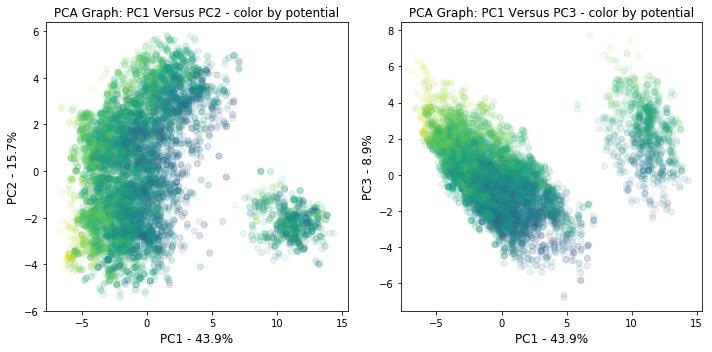

...

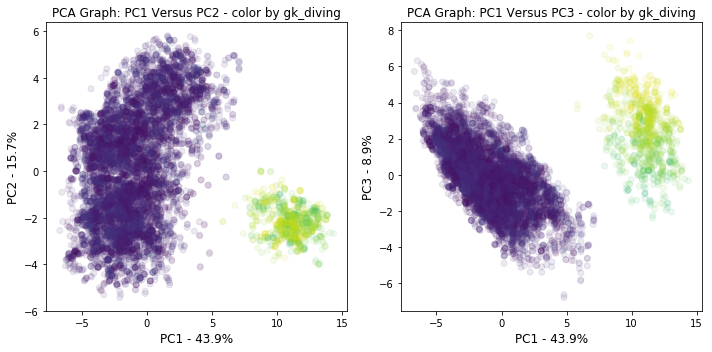

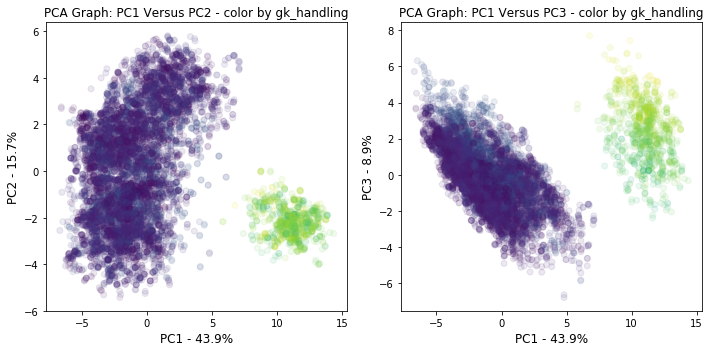

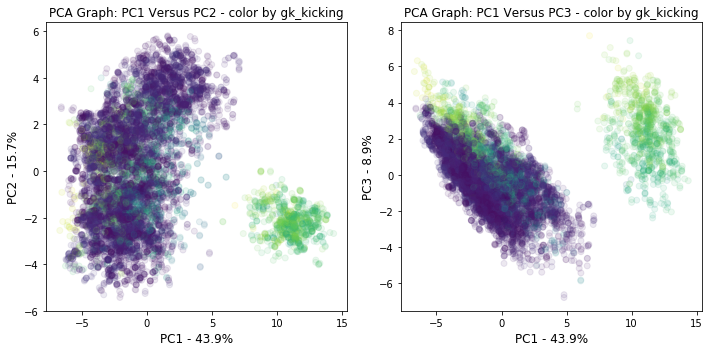

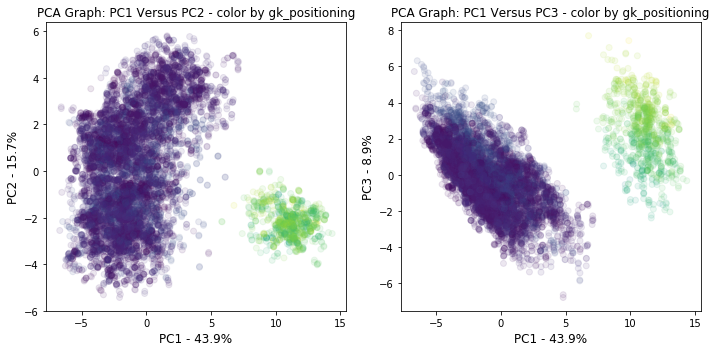

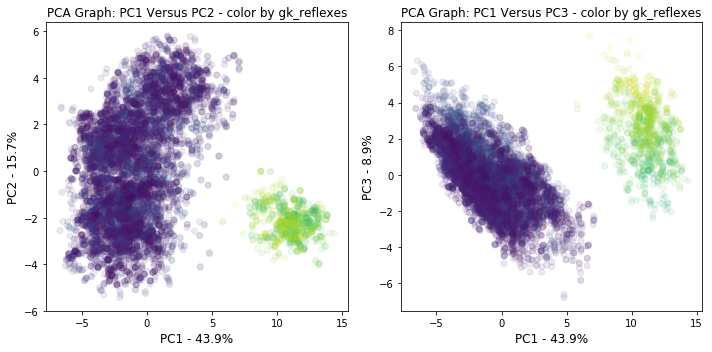

In [13]:
# draw PCA 2D plot: PC1 Vs PC2 and PC1 Vs PC3 
def color_plot (i):
    plt.figure(figsize=(10, 5))    
    plt.subplot(1,2,1)
    
    plt.scatter(pca_df.PC1, pca_df.PC2, c=scaled_data[:,i], alpha=0.1)
    plt.title("PCA Graph: PC1 Versus PC2 - color by " + numeric_col[i], fontsize='12')
    plt.xlabel('PC1 - {0}%'.format(per_var[0]), fontsize='12')
    plt.ylabel('PC2 - {0}%'.format(per_var[1]), fontsize='12')
    plt.tight_layout()
    
    plt.subplot(1,2,2)
    plt.scatter(pca_df.PC1, pca_df.PC3, c=scaled_data[:,i], alpha=0.1) 
    plt.title("PCA Graph: PC1 Versus PC3 - color by " + numeric_col[i], fontsize='12')
    plt.xlabel('PC1 - {0}%'.format(per_var[0]), fontsize='12')
    plt.ylabel('PC3 - {0}%'.format(per_var[2]), fontsize='12')
    plt.tight_layout()
    plt.show()
    plt.close()

for j in range(0,38):
    color_plot (j)


gk_diving > 40 (goalkeepers)


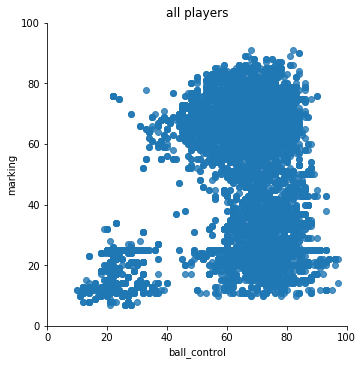

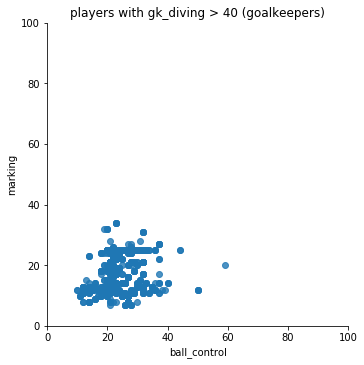

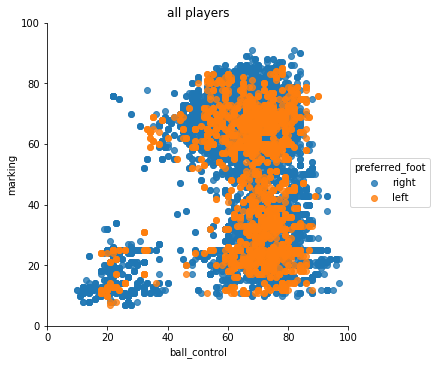

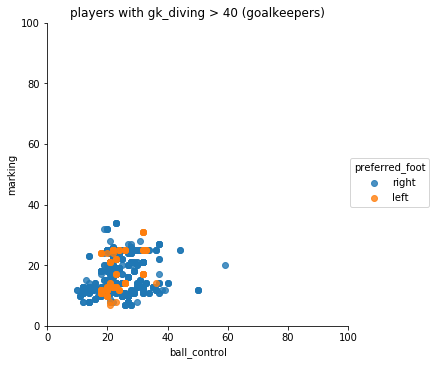

plot preferred left foot


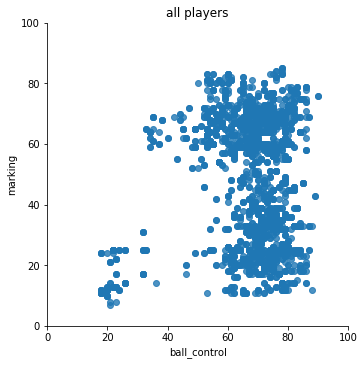

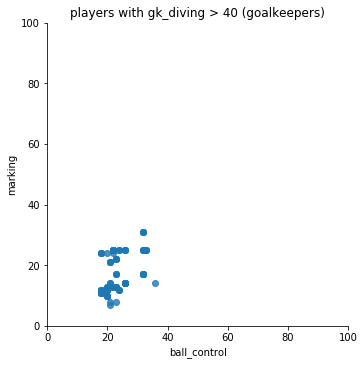

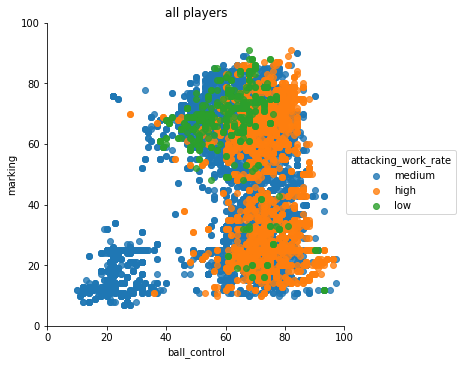

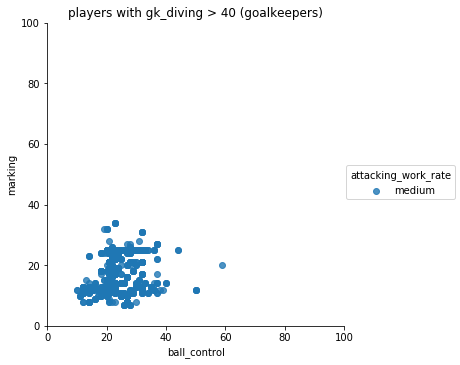

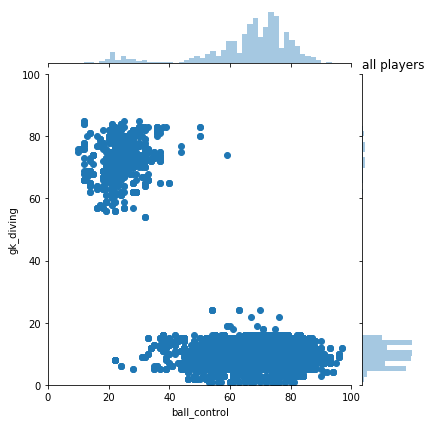

...

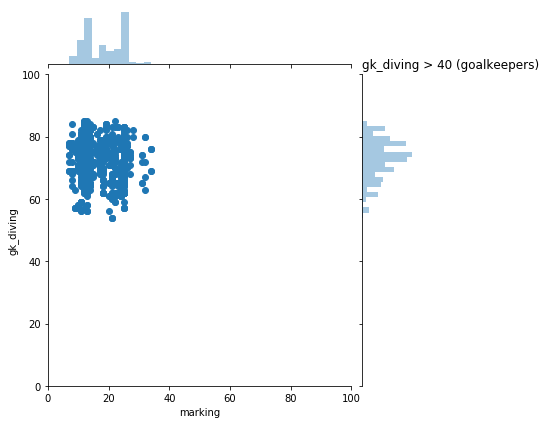

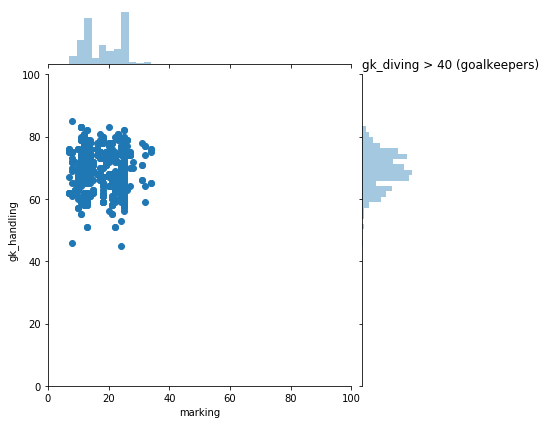

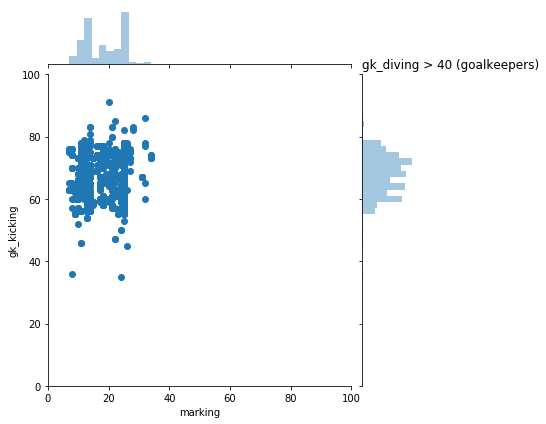

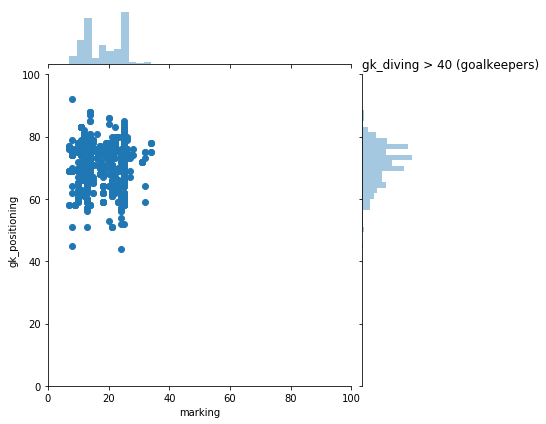

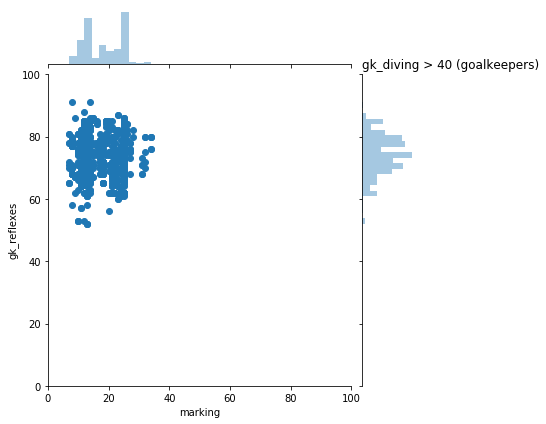

In [17]:
#'attacking_work_rate', 'defensive_work_rate'] 
#plt.title('players with gk_diving > 40',loc='center')    
def plot (df_all, df_sub, hue_col):  
    # first plot
    vis1=sns.lmplot(x='ball_control', y='marking',  hue=hue_col, sharex=False, data=df_all, scatter=True, fit_reg=False, units=None, order=1, legend=True)
    plt.title('all players')
    plt.xlim(0,100)
    plt.ylim(0,100)
    plt.show()
    plt.close()
    # second plot: goalkeepers only
    vis2=sns.lmplot(x='ball_control', y='marking',  hue=hue_col, sharex=False, data=df_sub, scatter=True, fit_reg=False, units=None, order=1, legend=True)
    plt.title('players with gk_diving > 40 (goalkeepers)')
    plt.xlim(0,100)
    plt.ylim(0,100)
    plt.show()
    plt.close()

print('gk_diving > 40 (goalkeepers)')
df_goalkeepers=df_all_col.loc[df_all_col['gk_diving']>40]
#print(df_goalkeepers.head())
plot(df_all_col, df_goalkeepers, None)
    
# color by lefty and righty 
plot(df_all_col, df_goalkeepers, 'preferred_foot')
# plot lefty only
print('plot preferred left foot')
df1=df_all_col.loc[df_all_col['preferred_foot']=='left']
df2=df_goalkeepers.loc[df_goalkeepers['preferred_foot']=='left']
plot(df1,df2,None)

# color by 'attaching_work_rate'
df3=df_all_col[df_all_col['attacking_work_rate'].isin (['low','medium','high'])]
df4=df_goalkeepers[df_goalkeepers['attacking_work_rate'].isin (['low','medium','high'])]
plot(df3, df4, 'attacking_work_rate')

#plot jointplot with goal keeper attributes: 
#'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes'
def joint_plot (df, title) :  
    vis=sns.jointplot(x='ball_control',y='gk_diving', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='ball_control',y='gk_handling', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='ball_control',y='gk_kicking', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='ball_control',y='gk_positioning', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='ball_control',y='gk_reflexes', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()


    vis=sns.jointplot(x='marking',y='gk_diving', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='marking',y='gk_handling', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='marking',y='gk_kicking', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='marking',y='gk_positioning', xlim=(0,100), ylim=(0,100), data=df, stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='marking',y='gk_reflexes', xlim=(0,100), ylim=(0,100), data=df, stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()

'''
    vis=sns.jointplot(x='dribbling',y='gk_diving', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='dribbling',y='gk_handling', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='dribbling',y='gk_kicking', data=df, xlim=(0,100), ylim=(0,100), stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='dribbling',y='gk_positioning', xlim=(0,100), ylim=(0,100), data=df, stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
    vis=sns.jointplot(x='dribbling',y='gk_reflexes', xlim=(0,100), ylim=(0,100), data=df, stat_func=None)
    plt.title(title, loc='left')
    plt.show()
    plt.close()
'''

# df_goalkeepers=df_all_col.loc[df_all_col['gk_diving']>40]    
joint_plot (df_all_col, 'all players')
joint_plot (df_goalkeepers, 'gk_diving > 40 (goalkeepers)')

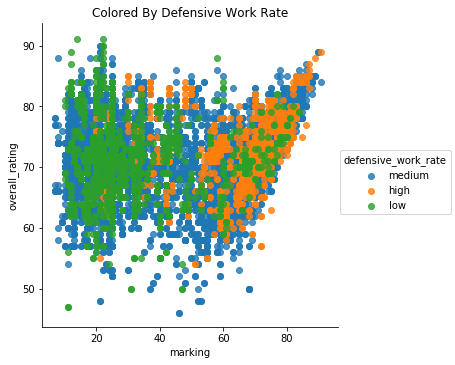

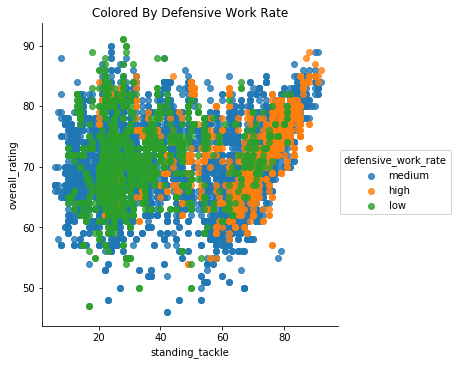

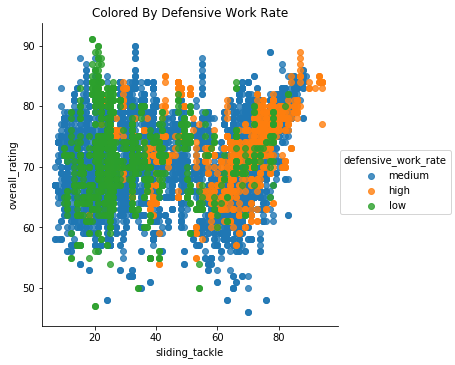

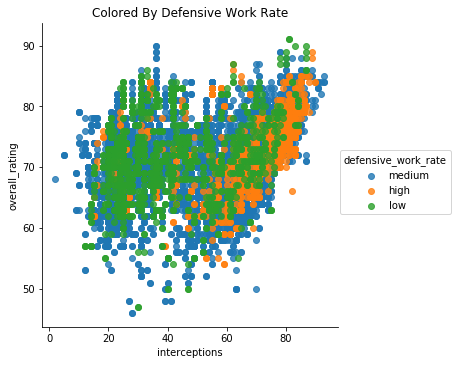

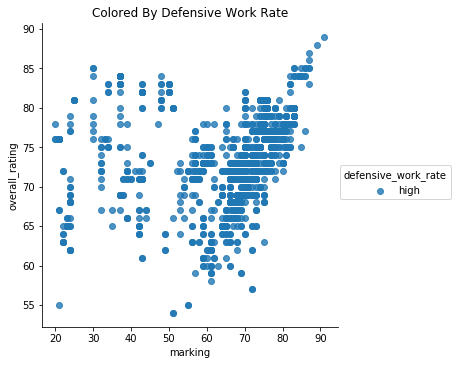

...

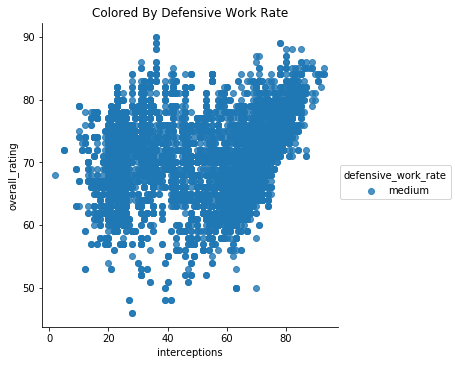

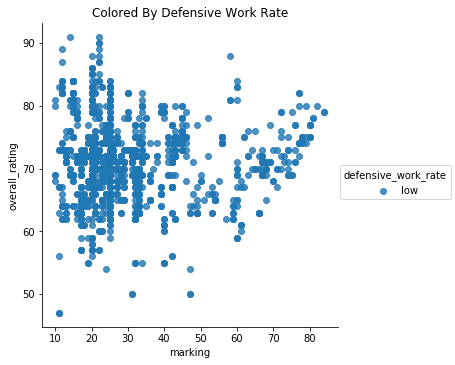

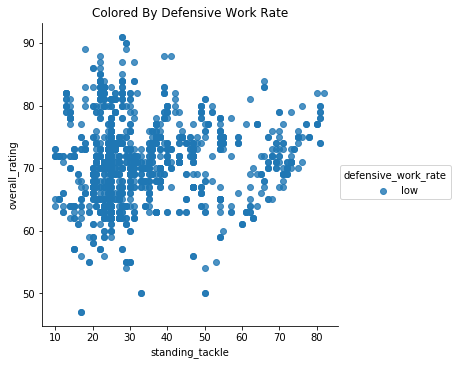

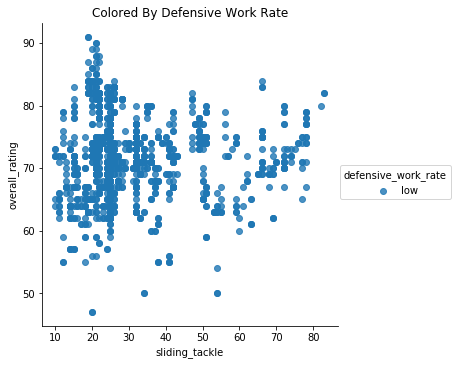

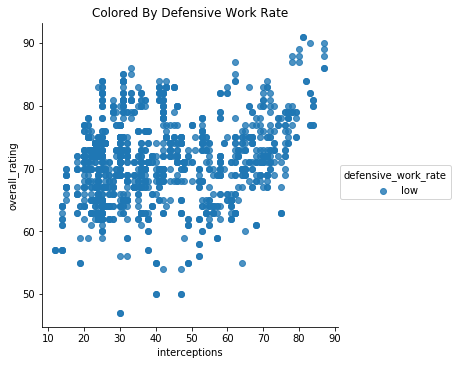

In [42]:
import seaborn as sns
df1=df_all_col[df_all_col['defensive_work_rate'].isin (['low','medium','high'])]
df2=df_all_col[df_all_col['defensive_work_rate'].isin (['high'])]
df3=df_all_col[df_all_col['defensive_work_rate'].isin (['medium'])]
df4=df_all_col[df_all_col['defensive_work_rate'].isin (['low'])]

def lmplot (df):
    vis=sns.lmplot(x='marking', y='overall_rating',  hue='defensive_work_rate', sharex=False, data=df, \
                   scatter=True, fit_reg=False, units=None, order=1, legend=True)
    plt.title('Colored By Defensive Work Rate')
    plt.show()
    plt.close()

    vis=sns.lmplot(x='standing_tackle', y='overall_rating',  hue='defensive_work_rate', sharex=False, data=df, \
                   scatter=True, fit_reg=False, units=None, order=1, legend=True)
    plt.title('Colored By Defensive Work Rate')
    plt.show()
    plt.close()

    vis=sns.lmplot(x='sliding_tackle', y='overall_rating',  hue='defensive_work_rate', sharex=False, data=df, \
                   scatter=True, fit_reg=False, units=None, order=1, legend=True)
    plt.title('Colored By Defensive Work Rate')
    plt.show()
    plt.close()               

    vis=sns.lmplot(x='interceptions', y='overall_rating',  hue='defensive_work_rate', sharex=False, data=df, \
                   scatter=True, fit_reg=False, units=None, order=1, legend=True)
    plt.title('Colored By Defensive Work Rate')
    plt.show()
    plt.close()

lmplot(df1) #color by 'defensive_work_rate'].isin (['low','medium','high'])
lmplot(df2) #color by 'defensive_work_rate'].isin (['high'])
lmplot(df3) #color by 'defensive_work_rate'].isin (['medium'])
lmplot(df4) #color by 'defensive_work_rate'].isin (['low'])

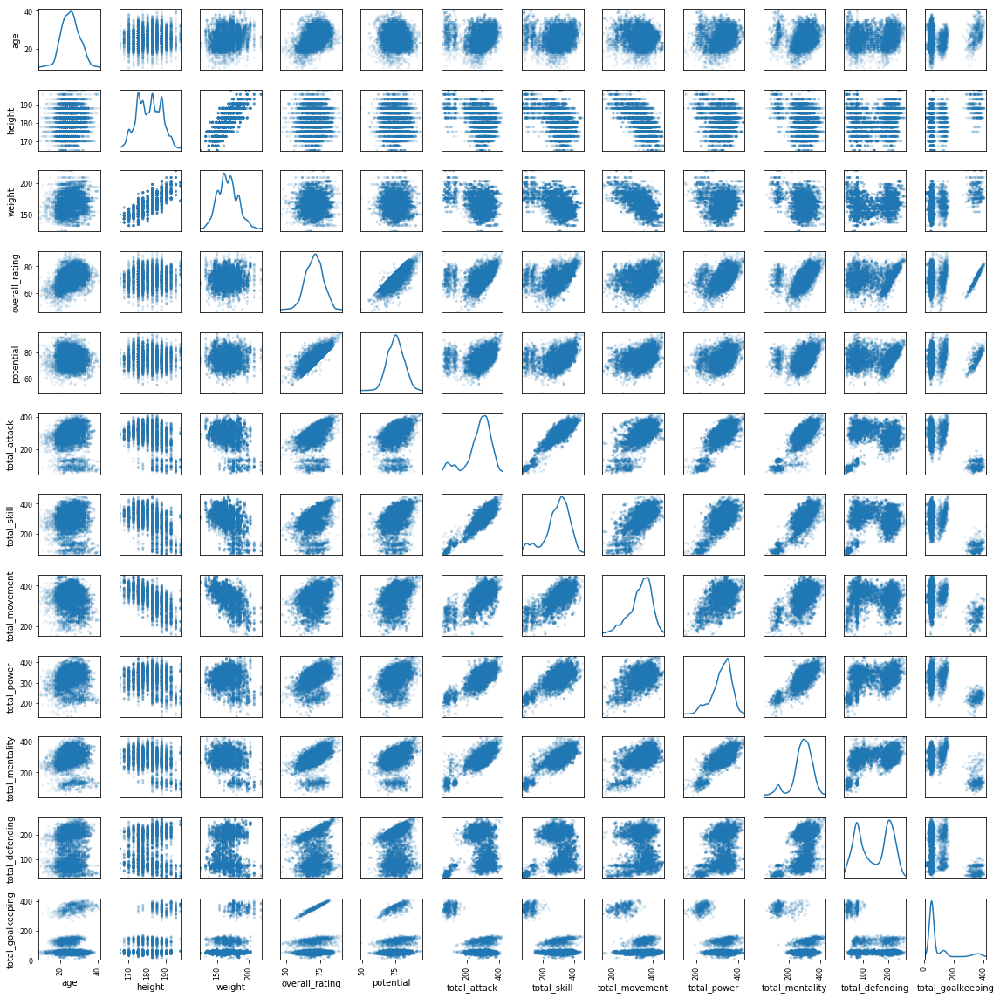

(10898, 15)
       age  height  weight  overall_rating  potential  total_attack  \
1045  31.0   177.8     165            73.0       75.0         311.0   
1046  31.0   177.8     165            72.0       75.0         307.0   
1047  30.0   177.8     165            73.0       75.0         305.0   
1048  28.0   177.8     165            73.0       75.0         298.0   
1049  28.0   177.8     165            70.0       72.0         288.0   

      total_skill  total_movement  total_power  total_mentality  \
1045        319.0           375.0        355.0            351.0   
1046        318.0           375.0        355.0            372.0   
1047        316.0           377.0        357.0            372.0   
1048        311.0           372.0        355.0            370.0   
1049        335.0           366.0        346.0            356.0   

      total_defending  total_goalkeeping  player_fifa_api_id  \
1045            219.0               42.0               17880   
1046            216.0         

In [4]:
df_totals=df_all_col[numeric_few_col]
pd.plotting.scatter_matrix(df_totals, alpha=0.1, figsize=(16, 16), diagonal='kde',range_padding =0.01)
plt.tight_layout()
plt.show()
plt.close()

total_cols = numeric_few_col + ['player_fifa_api_id', 'player_name']
df_t=df_all_col[total_cols]
df_t.to_csv('player_total_score_per_attributes_category.csv')
print(df_t.shape)
print (df_t.head())


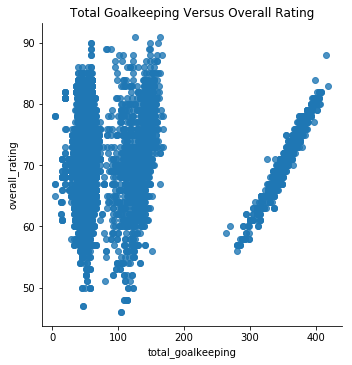

A Closer Look at the Goalkeeper Subgroup on the Far Right
 total_goalkeeping > 250 
 
Strong Positive Linear Correlation: 
                   total_goalkeeping  overall_rating
total_goalkeeping           1.000000        0.978269
overall_rating              0.978269        1.000000


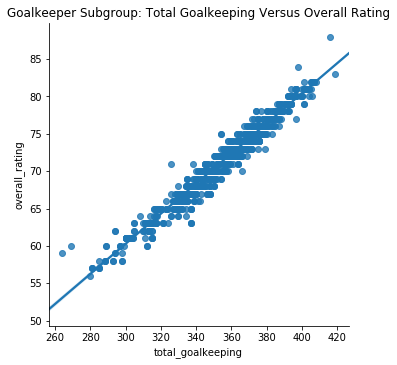

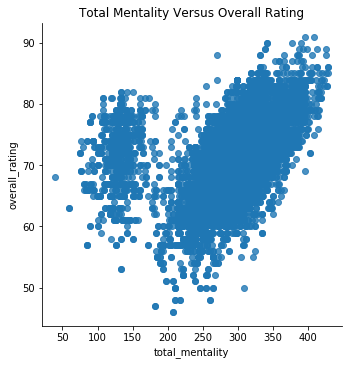

A Closer Look at the Non_goalkeeper Subgroup on the Far Right
 total_goalkeeping < 250
 
Moderate Positive Linear Correlation: 
                 total_mentality  overall_rating
total_mentality          1.00000         0.67607
overall_rating           0.67607         1.00000


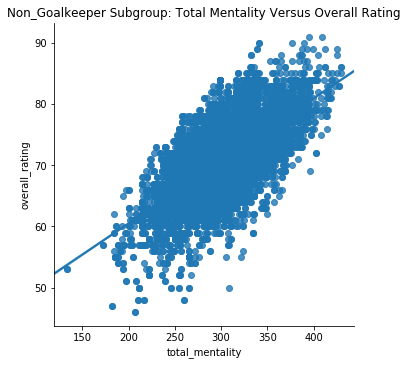

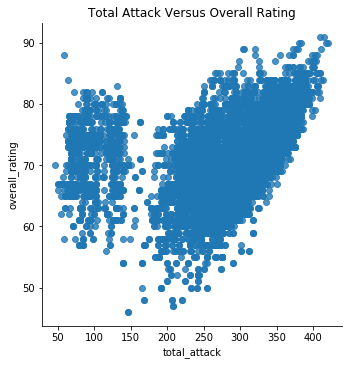

A Closer Look at the Non_goalkeeper Subgroup on the Far Right
 total_goalkeeping < 250
 
Moderate Positive Linear Correlation: 
                total_attack  overall_rating
total_attack        1.000000        0.628757
overall_rating      0.628757        1.000000


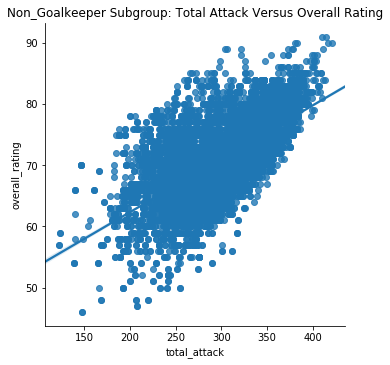

In [16]:
# Total Goalkeeping
vis=sns.lmplot(x='total_goalkeeping', y='overall_rating',  hue = None, sharex=False, data=df_totals, \
               scatter=True, fit_reg=False, units=None, order=1, legend=True)
plt.title('Total Goalkeeping Versus Overall Rating')
plt.show()
plt.close()

df_totals_gk = df_totals[df_totals['total_goalkeeping'] > 250]
corr_gk=df_totals_gk[['total_goalkeeping','overall_rating']].corr()
print ('A Closer Look at the Goalkeeper Subgroup on the Far Right')
print(' total_goalkeeping > 250 ')
print(' ')
print('Strong Positive Linear Correlation: ')
print(corr_gk)

vis=sns.lmplot(x='total_goalkeeping', y='overall_rating',  hue = None, sharex=False, data=df_totals_gk, \
               scatter=True, fit_reg=True, units=None, order=1, legend=True)
plt.title('Goalkeeper Subgroup: Total Goalkeeping Versus Overall Rating')
plt.show()
plt.close()

# Total Mentality
vis=sns.lmplot(x='total_mentality', y='overall_rating',  hue = None, sharex=False, data=df_totals, \
               scatter=True, fit_reg=False, units=None, order=1, legend=True)
plt.title('Total Mentality Versus Overall Rating')
plt.show()
plt.close()

df_totals_non_gk = df_totals[df_totals['total_goalkeeping'] < 250]
corr_mentality=df_totals_non_gk[['total_mentality','overall_rating']].corr()
print ('A Closer Look at the Non_goalkeeper Subgroup on the Far Right')
print(' total_goalkeeping < 250')
print(' ')
print ('Moderate Positive Linear Correlation: ')
print(corr_mentality)

vis=sns.lmplot(x='total_mentality', y='overall_rating',  hue = None, sharex=False, data=df_totals_non_gk, \
               scatter=True, fit_reg=True, units=None, order=1, legend=True)
plt.title('Non_Goalkeeper Subgroup: Total Mentality Versus Overall Rating')
plt.show()
plt.close()

# Total Atack
vis=sns.lmplot(x='total_attack', y='overall_rating',  hue = None, sharex=False, data=df_totals, \
               scatter=True, fit_reg=False, units=None, order=1, legend=True)
plt.title('Total Attack Versus Overall Rating')
plt.show()
plt.close()

df_totals_non_gk = df_totals[df_totals['total_goalkeeping'] < 250]
corr_attack=df_totals_non_gk[['total_attack','overall_rating']].corr()
print ('A Closer Look at the Non_goalkeeper Subgroup on the Far Right')
print(' total_goalkeeping < 250')
print(' ')
print ('Moderate Positive Linear Correlation: ')
print(corr_attack)

vis=sns.lmplot(x='total_attack', y='overall_rating',  hue = None, sharex=False, data=df_totals_non_gk, \
               scatter=True, fit_reg=True, units=None, order=1, legend=True)
plt.title('Non_Goalkeeper Subgroup: Total Attack Versus Overall Rating')
plt.show()
plt.close()

## Interpret correlation coefficient

Exactly –1. A perfect downhill (negative) linear relationship <br>
• –0.70.    A strong downhill (negative) linear relationship <br>
• –0.50.    A moderate downhill (negative) relationship <br>
• –0.30.    A weak downhill (negative) linear relationship <br>
•  0.       No linear relationship <br>

In [21]:
# save correlation coefficient for dataset to csv
df_corr = df_unscaled_data.corr()
df_corr.to_csv('df_corr.csv')

df_gk=df_unscaled_data.loc[df_unscaled_data['gk_diving']>40]
df_gk_corr = df_gk.corr()
df_gk_corr.to_csv('df_gk_corr.csv')

df_non_gk=df_unscaled_data.loc[df_unscaled_data['gk_diving']<40]
df_non_gk_corr = df_non_gk.corr()
df_non_gk_corr.to_csv('df_non_gk_corr.csv')

Unscaled Data Scatter Matrix 1
PC1 sorted components:  Index(['ball_control', 'dribbling', 'short_passing', 'crossing', 'curve',
       'long_shots', 'positioning', 'shot_power', 'vision', 'gk_diving',
       'free_kick_accuracy', 'gk_reflexes', 'gk_handling', 'gk_positioning',
       'volleys', 'finishing', 'acceleration', 'penalties', 'sprint_speed'],
      dtype='object')


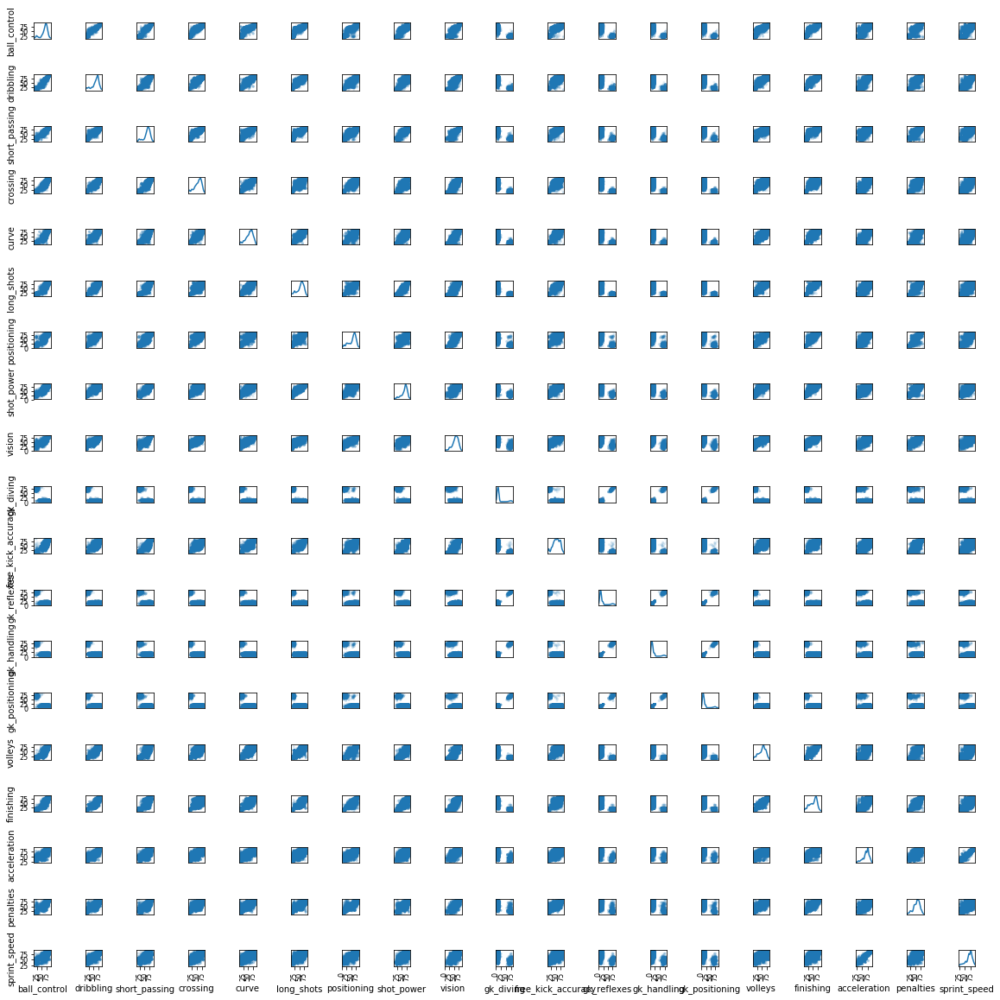

In [31]:
print('Unscaled Data Scatter Matrix 1')
print('PC1 sorted components: ', loading_scores_PC1_sorted.index[0:19])
#col_of_interest = ['ball_control', 'dribbling', 'short_passing', 'crossing', 'curve','long_shots', 'positioning', 'shot_power', 'vision', 'gk_diving','free_kick_accuracy', 'gk_reflexes', 'gk_handling']
col_of_interest = loading_scores_PC1_sorted.index[0:19]
df_col_of_interest= df_unscaled_data[col_of_interest] # scatter matrix for columns of interest


pd.plotting.scatter_matrix(df_col_of_interest, alpha=0.1, figsize=(16, 16), diagonal='kde',range_padding =0.01)
plt.tight_layout()
plt.show()
plt.close()

Unscaled Data Scatter Matrix 2
PC1 sorted components:  Index(['long_passing', 'agility', 'stamina', 'balance', 'height',
       'heading_accuracy', 'weight', 'gk_kicking', 'reactions', 'aggression',
       'overall_rating', 'potential', 'interceptions', 'standing_tackle',
       'sliding_tackle', 'marking', 'strength', 'age', 'jumping'],
      dtype='object')


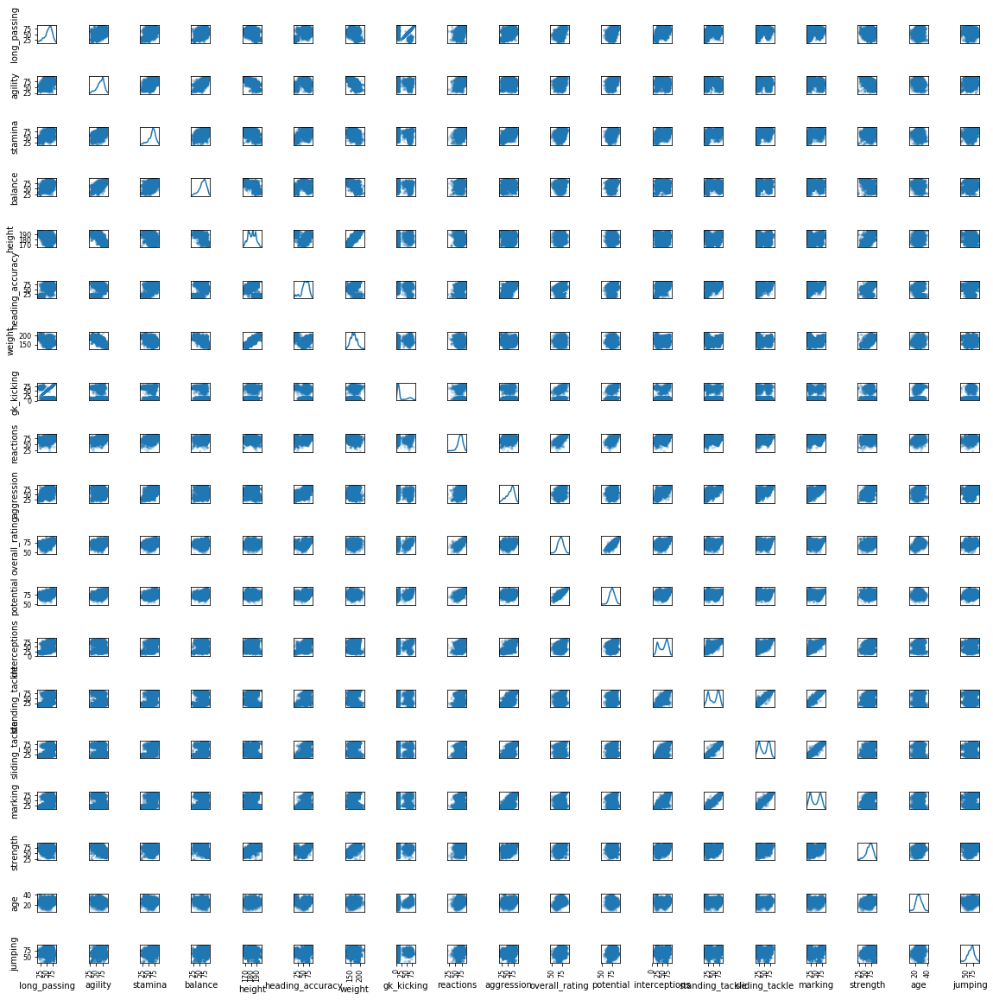

In [39]:
print('Unscaled Data Scatter Matrix 2')
print('PC1 sorted components: ', loading_scores_PC1_sorted.index[19:38])
#col_of_interest = ['ball_control', 'dribbling', 'short_passing', 'crossing', 'curve','long_shots', 'positioning', 'shot_power', 'vision', 'gk_diving','free_kick_accuracy', 'gk_reflexes', 'gk_handling']
col_of_interest = loading_scores_PC1_sorted.index[19:38]
df_col_of_interest= df_unscaled_data[col_of_interest] # scatter matrix for columns of interest

pd.plotting.scatter_matrix(df_col_of_interest, alpha=0.1, figsize=(16, 16), diagonal='kde',range_padding =0.01)
plt.tight_layout()
plt.show()
plt.close()

['player_fifa_api_id', 'preferred_foot', 'attacking_work_rate', 'defensive_work_rate', 'age', 'height', 'weight', 'overall_rating', 'potential', 'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys', 'dribbling', 'curve', 'free_kick_accuracy', 'long_passing', 'ball_control', 'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots', 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'marking', 'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes']
      player_fifa_api_id  player_fifa_api_id preferred_foot  \
1045               17880               17880          right   
1046               17880               17880          right   
1047               17880               17880          right   
1048               17880               17880          right   
1049               17880               17880          right   

     a

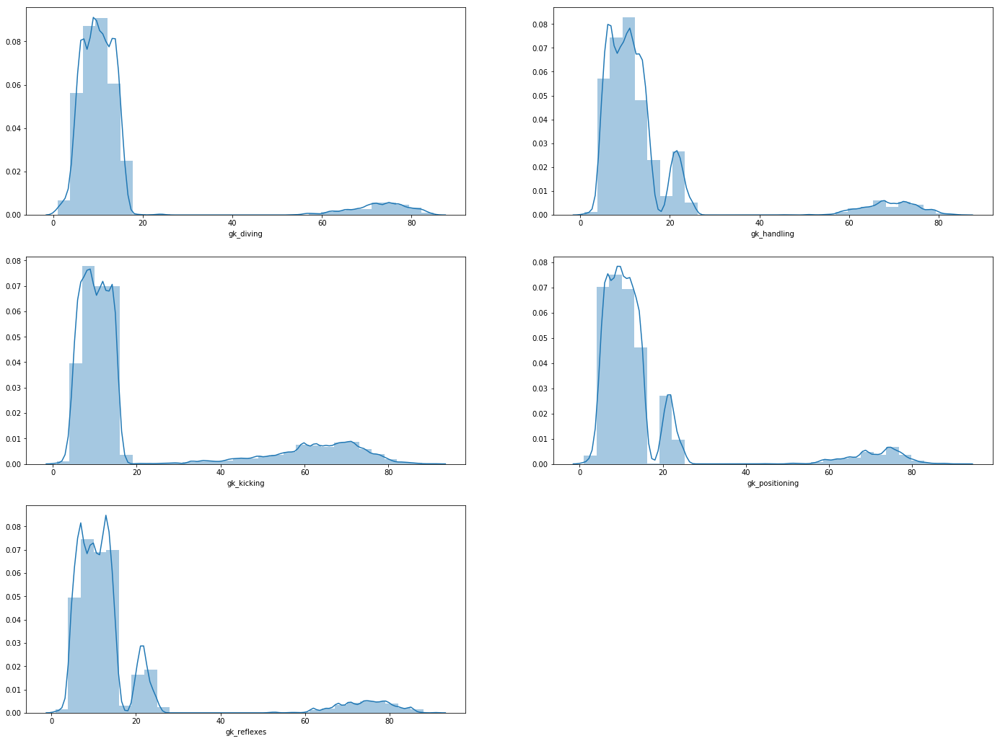

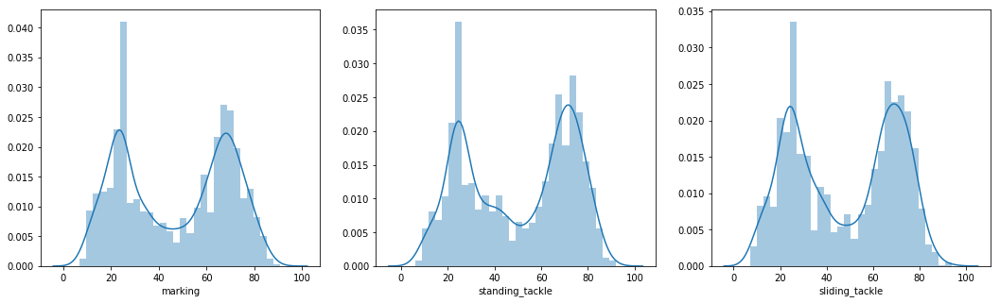

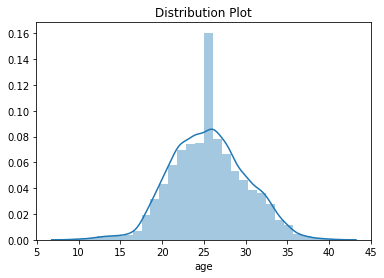

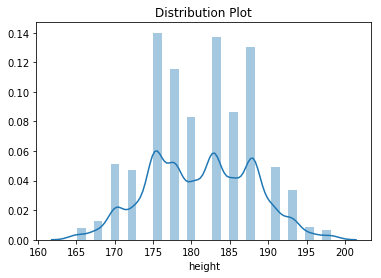

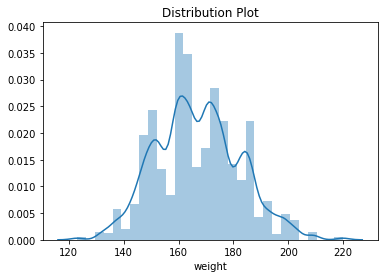

...

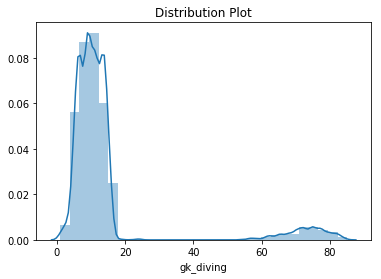

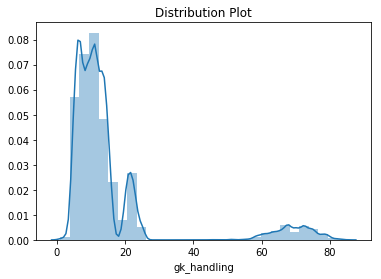

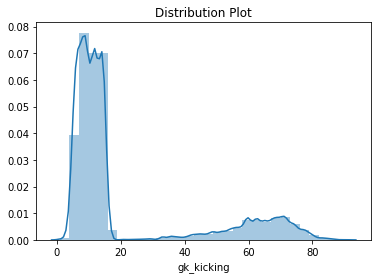

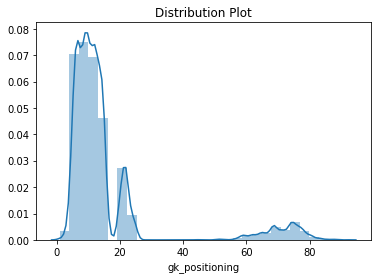

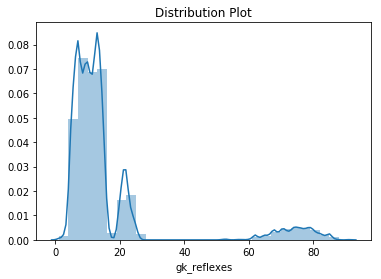

In [36]:
# create distribution plot for all features

final_col = ['player_fifa_api_id','preferred_foot','attacking_work_rate', 'defensive_work_rate'] + numeric_col
print(final_col)
df_final=df_all_col[final_col]
'''
df_final=def_all_col['player_fifa_api_id', 'preferred_foot', 'attacking_work_rate', 'defensive_work_rate', 'age', \
                     'height', 'weight', 'overall_rating', 'potential', 'crossing', 'finishing', 'heading_accuracy', \
                     'short_passing', 'volleys', 'dribbling', 'curve', 'free_kick_accuracy', 'long_passing', \
                     'ball_control', 'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance', 'shot_power', \
                     'jumping', 'stamina', 'strength', 'long_shots', 'aggression', 'interceptions', 'positioning', \
                     'vision', 'penalties', 'marking', 'standing_tackle', 'sliding_tackle', 'gk_diving', 'gk_handling', \
                     'gk_kicking', 'gk_positioning', 'gk_reflexes']
'''
print(df_final.head())
print(len(final_col))
df_final.to_csv("df_final.csv")

# distplot for goalkeeping attributes
fig = plt.figure(figsize=(24,18))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
vis1=sns.distplot (df_all_col['gk_diving'], bins=30, ax=ax1)
vis2=sns.distplot (df_all_col['gk_handling'], bins=30, ax=ax2)
vis3=sns.distplot (df_all_col['gk_kicking'], bins=30, ax=ax3)
vis4=sns.distplot (df_all_col['gk_positioning'], bins=30, ax=ax4)
vis5=sns.distplot (df_all_col['gk_reflexes'], bins=30, ax=ax5)
plt.show() 
plt.close()

# distplot for defending attributes
fig = plt.figure(figsize=(18,5))
ax6 = fig.add_subplot(131)
ax7 = fig.add_subplot(132)
ax8 = fig.add_subplot(133)
vis6=sns.distplot (df_all_col['marking'], bins=30, ax=ax6)
vis7=sns.distplot (df_all_col['standing_tackle'], bins=30, ax=ax7)
vis8=sns.distplot (df_all_col['sliding_tackle'], bins=30, ax=ax8)
plt.show()
plt.close()

#  distplot
for i in range (4,42) :
    sns.distplot (df_all_col[final_col[i]], bins=30)
    plt.title('Distribution Plot')
    plt.show()
    plt.close()



A Closer Look at Overall Rating Versus Reactions Attributes
 
All Players
                reactions  overall_rating
reactions         1.00000         0.72483
overall_rating    0.72483         1.00000


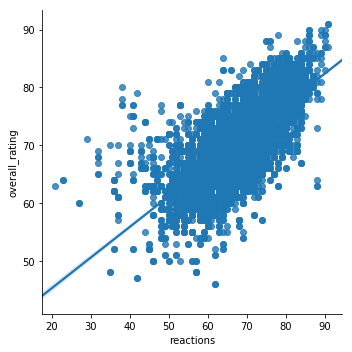

                reactions  overall_rating
reactions         1.00000         0.72456
overall_rating    0.72456         1.00000


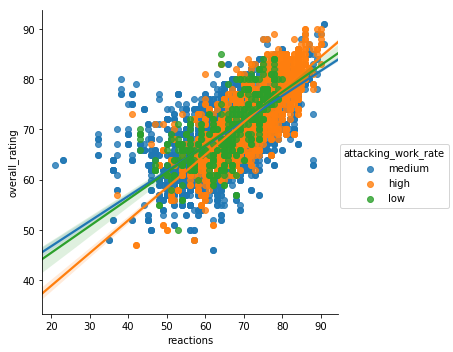

                reactions  overall_rating
reactions        1.000000        0.725001
overall_rating   0.725001        1.000000


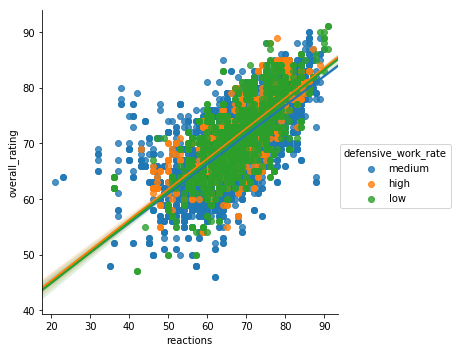

Non_Goalkeepers: gk_diving < 50
                reactions  overall_rating
reactions        1.000000        0.759507
overall_rating   0.759507        1.000000


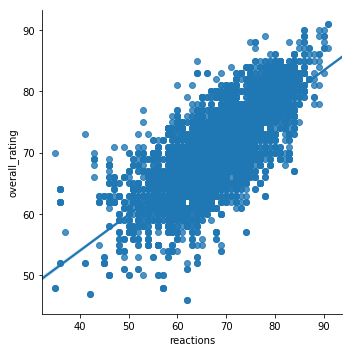

Goalkeepers Only: gk_diving > 50
                reactions  overall_rating
reactions         1.00000         0.56092
overall_rating    0.56092         1.00000


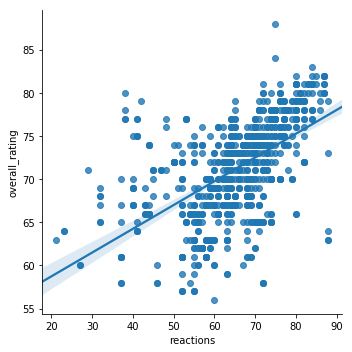

Goalkeepers Only: gk_diving > 50
                gk_diving  overall_rating
gk_diving        1.000000        0.897919
overall_rating   0.897919        1.000000


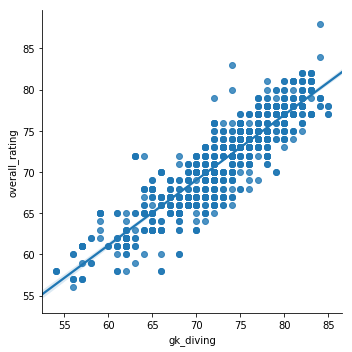

Goalkeepers Only: gk_diving > 50
                gk_handling  overall_rating
gk_handling        1.000000        0.828148
overall_rating     0.828148        1.000000


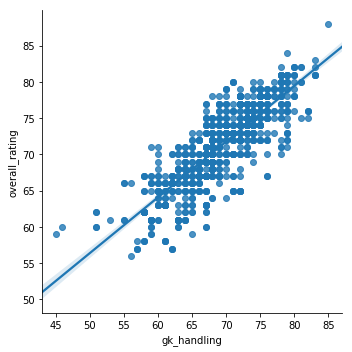

Goalkeepers Only: gk_diving > 50
                gk_positioning  overall_rating
gk_positioning        1.000000        0.863162
overall_rating        0.863162        1.000000


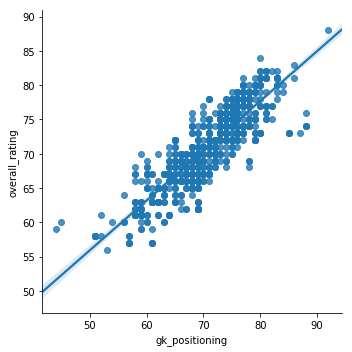

Goalkeepers Only: gk_diving > 50
                gk_reflexes  overall_rating
gk_reflexes        1.000000        0.877756
overall_rating     0.877756        1.000000


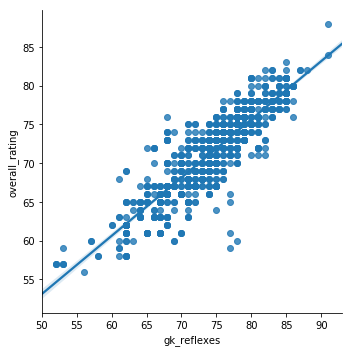

In [32]:
####
def print_corr (x_attribute, y_attribute, df, title):
    corr15=df[[x_attribute, y_attribute]].corr()
    print(title)
    print(corr15)
    vis15=sns.lmplot( x=x_attribute, y=y_attribute, hue=None, sharex=False, data=df, scatter=True, fit_reg=True, units=None, order=1, legend=True)
    plt.show()
    plt.close()   
###

print('A Closer Look at Overall Rating Versus Reactions Attributes')
print(' ')
print_corr('reactions', 'overall_rating', df_all_col, 'All Players')

# hue: attacking work rate
df11=df_all_col[df_all_col['attacking_work_rate'].isin (['low','medium','high'])]
corr11=df11[['reactions','overall_rating']].corr()
print(corr11)
vis11=sns.lmplot( x='reactions', y='overall_rating', hue='attacking_work_rate', sharex=False, data=df11, scatter=True, fit_reg=True, units=None, order=1, legend=True)
plt.show()

# hue: defensive work rate
df12=df_all_col[df_all_col['defensive_work_rate'].isin (['low','medium','high'])]
corr12=df12[['reactions','overall_rating']].corr()
print(corr12)
vis12=sns.lmplot( x='reactions', y='overall_rating', hue='defensive_work_rate', sharex=False, data=df12, scatter=True, fit_reg=True, units=None, order=1, legend=True)
plt.show()

df_goalkeepers=df_all_col[df_all_col['gk_diving'] > 50] # goalkeepers
df_non_goalkeepers=df_all_col[df_all_col['gk_diving'] < 50] # non_goalkeepers


##### 
    
#df_non_goalkeepers=df_all_col[df_all_col['gk_diving'] < 50] # non_goalkeepers    
print_corr ('reactions','overall_rating', df_non_goalkeepers, 'Non_Goalkeepers: gk_diving < 50')    
print_corr ('reactions','overall_rating', df_goalkeepers, 'Goalkeepers Only: gk_diving > 50')  
    
#df_goalkeepers=df_all_col[df_all_col['gk_diving'] > 50] # goalkeepers
print_corr ('gk_diving','overall_rating',df_goalkeepers, 'Goalkeepers Only: gk_diving > 50')
print_corr ('gk_handling','overall_rating',df_goalkeepers, 'Goalkeepers Only: gk_diving > 50')
print_corr ('gk_positioning','overall_rating',df_goalkeepers, 'Goalkeepers Only: gk_diving > 50')
print_corr ('gk_reflexes','overall_rating',df_goalkeepers, 'Goalkeepers Only: gk_diving > 50')
    

